# 2.3. Построение простого стационарного решения уравнения фильтрации с учетом суперпозиции и постоянного забойного давления на скважинах

Материалы курсов "Исследования скважин и пластов" и "Гидродинамические исследования скважин" в РГУ нефти и газа имени И.М.Губкина.

Версия 0.2 от 18.10.2023

Хабибуллин Ринат 2023 г.

Содержание
1. [Суперпозиция для нескольких скважин с постоянным дебитом](#231)
2. [Суперпозиция для нескольких скважин с постоянным забойным давлением](#232)
3. [Сравнение решений с постоянными дебитами и постоянными забойными давлениями с использованием plotly](#233)
4. [Задания для самостоятельной работы](#234)



In [1]:
# импортируем библиотеки для расчетов

# numpy используем для работы с массивами и подготовки данных для построения графиков. 
# Также в некоторых функциях используем возможности векторных расчетов numpy
import numpy as np
import scipy

# matplotlib используем для построения графиков
import matplotlib.pyplot as plt

# plotly используем как альтернативный инструмент построения графиков
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
def p_ss_atma(p_res_atma = 250,
              q_liq_sm3day = 50,
              mu_cP = 1,
              B_m3m3 = 1.2,
              k_mD = 40,
              h_m = 10,
              r_e_m = 240,
              r_m = 0.1):
  """
  функция расчета давления в произвольной точке пласта 
  на расстоянии r_m от центра скважины
  для стационарного решения уравнения фильтрации 
  p_res_atma - пластовое давление, давление на контуре питания
  q_liq_sm3day - дебит жидкости на поверхности в стандартных условиях
  mu_cP - вязкость нефти (в пластовых условиях)
  B_m3m3 - объемный коэффициент нефти 
  k_mD - проницаемость пласта
  h_m - мощность пласта, м
  r_e_m - радиус контрура питания, м  
  r_m - расстояние на котором проводится расчет, м
  """
  return p_res_atma - 18.41*q_liq_sm3day*mu_cP*B_m3m3/k_mD/h_m*np.log(r_e_m/r_m)


# 1. Суперпозиция для нескольких скважин с постоянным дебитом <a class="anchor" id="231"></a>

для стационарного решения работает принцип суперпозиции - сумма двух решений также будет решением, это позволяет построить карту для нескольких скважин.
Давление в любой точке пласта можно найти по формуле

$$P_{res} - P_{x,y} =  \sum_{i} 18.41\dfrac{ Q_i\mu B }{kh} \left[ \ln\dfrac{r_e}{\sqrt{ (x-x_{w.i})^2 + (y-y_{w.i})^2 }} +S \right]
\tag{1}$$

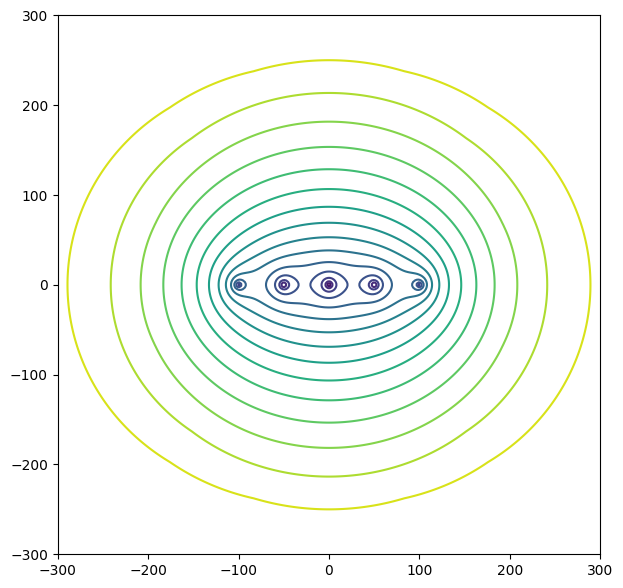

In [3]:
# зададим параметры воронки депрессии
pres = 250 
r_e = 300

# зададим координатную сетку основываясь на параметрах
x = np.linspace(-r_e, r_e, 300)
y = np.linspace(-r_e, r_e, 300)
# рассчитаем вспомогательные вектора для построения сетки
xv, yv = np.meshgrid(x, y)

# зададим координаты скважины (всего будет 5 скважин у которых меняется только х координата)
xwell = [-100, -50, 0 , 50, 100]
ywell = 0

# зададим пустой список матриц с перепадами давлений от каждой отдельной скважины
p_mesh_i=[]

# для каждой скважины найдем ее влияние на давления
for xi in xwell:
    # рассчитаем матрицу расстояний от элементов сетки до скважины i
    r_well = ((xv-xi)**2 + (yv-ywell)**2)**0.5
    # рассчитаем значение давлений во всех точках сетки для скважины i
    p_mesh_i_ = p_ss_atma(r_m=r_well, p_res_atma=pres, r_e_m=r_e)
    # удалим значения за контуром, так как в данном случае они не имеют смысла
    p_mesh_i_[np.where(p_mesh_i_ > pres)] = pres
    # сохраним влияние скважины i в списке матриц влияния отдельных скважин
    p_mesh_i.append(p_mesh_i_)
    
# найдем суммарное влияние все скважин
p_mesh_sum = 0
for p_mesh_i_ in p_mesh_i:
    # найдем сумму решений, помним что суммировать можно депрессии
    p_mesh_sum = pres - p_mesh_i_ + p_mesh_sum
p_mesh_sum = pres -  p_mesh_sum

# построим отображение в виде контурной карты
plt.rcParams["figure.figsize"] = (7,7)
plt.contour(x, y, p_mesh_sum, levels=15)
plt.show()

# 2. Суперпозиция для нескольких скважин с постоянным забойным давлением <a class="anchor" id="232"></a>


При наличии нескольких скважин можно записать выражение для оценки забойных давлений скважин


$$P_{res} - P_{wf.j} =  \sum_{i} 18.41\dfrac{ Q_i\mu B }{kh} \left[ \ln\dfrac{r_e}{\sqrt{ (x_{w.j}-x_{w.i})^2 + (y_{w.j}-y_{w.i})^2 }} +S \right]
\tag{2}$$

Если считать забойные давления $P_{wf.j}$ известными а дебиты скважин $Q_i$ не известными, тогда выражение (6) можно рассматривать как систему линейных алгебраических уравнений вида

$$AX = B \tag{3}$$

Где
$$A_{[i,j]} = 18.41\dfrac{ \mu B }{kh} \left[ \ln\dfrac{r_e}{\sqrt{ (x_{w.j}-x_{w.i})^2 + (y_{w.j}-y_{w.i})^2 }} +S \right]\tag{4}$$
$$B_{[j]}=P_{res} - P_{wf.j} \tag{5}$$

такую систему можно решить например с использованием пакета `scipy.linalg` 

[263.66757321 214.8006214  203.04830974 214.8006214  263.66757321]


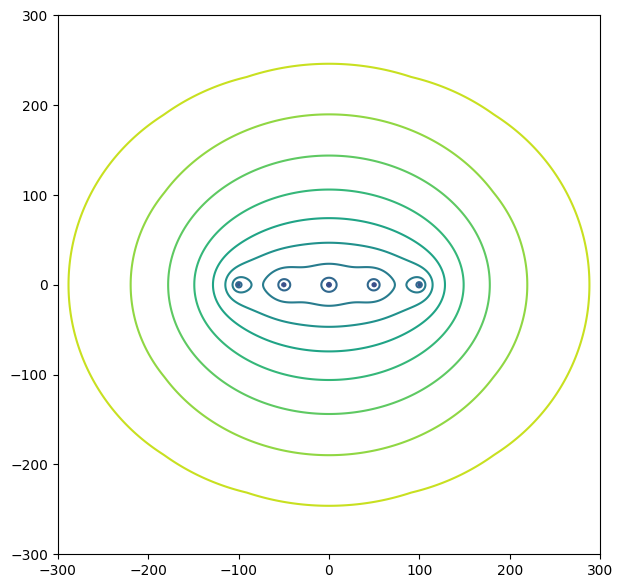

In [4]:
# зададим параметры воронки депрессии
pres = 250 
r_e = 300

# зададим координатную сетку основываясь на параметрах
x = np.linspace(-r_e, r_e, 500)
y = np.linspace(-r_e, r_e, 500)
# рассчитаем вспомогательные вектора для построения сетки
xv, yv = np.meshgrid(x, y)

# зададим координаты скважины (всего будет 5 скважин у которых меняется только х координата)
xwell = [-100, -50, 0 , 50, 100]
ywell = [0,0,0,0,0]
pwell = [100, 100, 100, 100, 100]   # забойные давления скважин
qwell = [0,0,0,0,0]  # дебиты скважин, должны быть найдены

# создадим заготовки матрицы А и вектора В по формулам (4) и (5)
A = np.zeros((5,5))
B = np.zeros(5)
# сформируем матрицу А
for i,v in enumerate(xwell):
    for j,v in enumerate(ywell):
        # найдем расстояния от одной скважины до другой
        # ищем расстояния между центрами скважин
        r_ij = ((xwell[i]-xwell[j])**2 + (ywell[i]-ywell[j])**2)**0.5
        # если расстояние 0 значит ищем влияние скважины саму на себя
        # тогда подставляем радиус скважины
        if r_ij == 0:
            r_ij = 0.1
        # чтобы воспользоваться ранее заданной формулой в виде функции
        # вызовем ее с нулем пластовым давлением и единичным дебитом
        A[i,j] = - p_ss_atma(p_res_atma = 0,
                              q_liq_sm3day = 1,
                              mu_cP = 1,
                              B_m3m3 = 1.2,
                              k_mD = 40,
                              h_m = 10,
                              r_e_m = 240,
                              r_m = r_ij)
    B[i] = pres - pwell[i]
# найдем решение = значения дебитов при которых забойные равны заданным значениям
qwell = scipy.linalg.solve(A,B)

# напечатаем найденные дебиты
print(qwell)

# зададим пустой список матриц с перепадами давлений от каждой отдельной скважины
p_mesh_i=[]

# для каждой скважины найдем ее влияние на давления
for i,xi in enumerate(xwell):
    # рассчитаем матрицу расстояний от элементов сетки до скважины i
    r_well = ((xv-xwell[i])**2 + (yv-ywell[i])**2)**0.5
    # для красоты отрисовки карты давлений пренебрежем значениями в радиусе одного метра от скважин
    r_well[r_well<1]=0.1
    # рассчитаем значение давлений во всех точках сетки для скважины i
    p_mesh_i_ = p_ss_atma(r_m=r_well, p_res_atma=pres, r_e_m=r_e, q_liq_sm3day=qwell[i])
    # удалим значения за контуром, так как в данном случае они не имеют смысла
    p_mesh_i_[np.where(p_mesh_i_ > pres)] = pres
    # сохраним влияние скважины i в списке матриц влияния отдельных скважин
    p_mesh_i.append(p_mesh_i_)
    
# найдем суммарное влияние все скважин
p_mesh_sum_new = 0
for p_mesh_i_ in p_mesh_i:
    # найдем сумму решений, помним что суммировать можно депрессии
    p_mesh_sum_new = pres - p_mesh_i_ + p_mesh_sum_new
p_mesh_sum_new = pres -  p_mesh_sum_new

# построим отображение в виде контурной карты
plt.rcParams["figure.figsize"] = (7,7)
plt.contour(x, y, p_mesh_sum_new, levels=15)
plt.show()

# 3. Сравнение решений с постоянными дебитами и постоянными забойными давлениями с использованием plotly <a class="anchor" id="233"></a>
сравним используя `plotly`

In [5]:
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{'type': 'surface'}]]
)

fig.add_trace(
    go.Surface(x=x, y=y, z=p_mesh_sum, colorscale='RdBu', showscale=False),
    row=1, col=1)
fig.update_layout(
    title_text='3D Воронка депрессии для нескольких скважин с постоянными дебитами',
    height=700,
    width=700
)

fig.show()

In [6]:
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{'type': 'surface'}]]
)

fig.add_trace(
    go.Surface(x=x, y=y, z=p_mesh_sum_new, colorscale='RdBu', showscale=False),
    row=1, col=1)
fig.update_layout(
    title_text='3D Воронка депрессии для нескольких скважин с постоянными Рзаб',
    height=700,
    width=700
)

fig.show()

# 4 Задания для самостоятельной работы <a class="anchor" id="234"></a>

Для совершенствования навыков работы с python выполните следующие задания:

1. Постройте карту распределения давления для нескольких скважин работающих в системе разработки с заданными забойными давлениями. Включите как добывающие, так и нагнетательные скважины.
2. На основе карты распределения давлений постройте карту линий тока (линии тока перпендикулярны изолиниям)